<a href="https://colab.research.google.com/github/Luis-Yovera/Deteccion_infraccion_vehicular_de_estacionamiento_en_cruce_peatonal_durante_semaforo_en_rojo/blob/PRACTICAS_U2/Copia_de_Practica_07A_Procesamiento_de_imagenes_en_el_dominio_del_espacio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**ESCUELA DE INGENIERÍA MECATRÓNICA**

## `PROCESAMIENTO DIGITAL DE SEÑALES E IMÁGENES`

### `Docente: Ms. Ing. Emerson Maximo Asto Rodriguez`


#### `Estudiantes:`
####`              Galarreta Grados, Luis Daniel Jesús`
#### `             Recuenco Tapia, Angie Tatiana`
#### `             Yovera Suarez, Luis Alberto`

```
Práctica 7A: Filtrado en el espacio
```

### 1. Implemente un algoritmo que permita realizar la correlacion 2D de una imagen de MxN con una mascara de mxn
* El algoritmo debe retornar una imagen de las mismas dimensiones que la imagen de entrada, recuerde que el "padding" usualmente se hace con ceros, no obstante se puede duplicar filas o columnas del borde, o hacerlo mediante un espejo sobre el borde.*

* El algoritmo tambien puede obtener la solución sin necesidad del "padding", agregando varias condicionales que permitan solo ponderar con los datos coincidentes.*

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [ ]:
def filtro_espacial(imagen, filtro):
    M, N = imagen.shape #Obteniendo las dimensiones de la imagen
    m, n = filtro.shape #Obteniendo las dimensiones del filtro

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * filtro
            resultado[i-filas_add, j-columnas_add] = np.sum(multiplicacion)

    return resultado

1. ¿Por qué es importante el uso de técnicas de padding en la aplicación de filtros espaciales?

El padding es el espacio determinado dentro de un elemento que separa el contenido real de los bordes de su marco, y es importante, ya que brinda espacio en los límites del elemento y de esta manera enfatizar el contenido y evitar que se sitúe cerca a sus bordes.

2. Explica qué es un kernel (o máscara) en un filtro espacial y cómo influye su tamaño en el procesamiento de imágenes.

Un kernel es una pequeña matriz de valores numéricos que se emplea para aplicar transformaciones a cada píxel en una imagen, en su mayoría, por medio de operaciones de convolución. Estos son comúnmente usados en los filtros espaciales, en operaciones de desenfoque, detección de bordes y resaltado de detalles.
El tamaño del kernel, influye considerablemente sobre la operación de filtrado, ya que un kernel pequeño tendrá un efecto de más suavizado o menos desenfoque, mientras que uno más amplio, trabaja sobre una mayor área y su efecto es más notable, empleado para la eliminación de ruido en la imagen.

In [ ]:
img = np.arange(100).reshape(10,10)
filtro = np.ones((5,7))

print(img)
print(filtro)

img_filtrada = filtro_espacial(img, filtro)

[[ 0  1  2  3  4  5  6  7  8  9]
 [10 11 12 13 14 15 16 17 18 19]
 [20 21 22 23 24 25 26 27 28 29]
 [30 31 32 33 34 35 36 37 38 39]
 [40 41 42 43 44 45 46 47 48 49]
 [50 51 52 53 54 55 56 57 58 59]
 [60 61 62 63 64 65 66 67 68 69]
 [70 71 72 73 74 75 76 77 78 79]
 [80 81 82 83 84 85 86 87 88 89]
 [90 91 92 93 94 95 96 97 98 99]]
[[1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]]


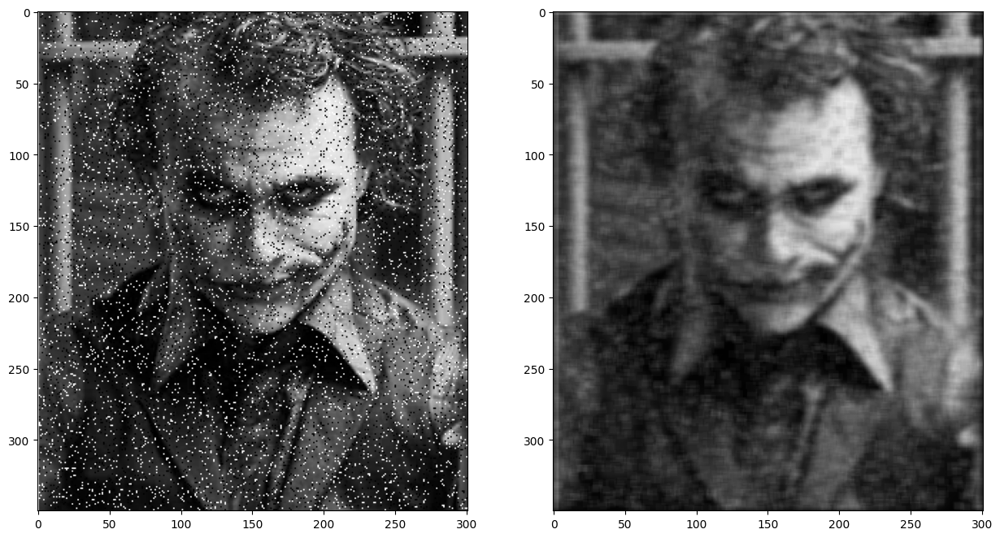

In [32]:
img_ruido = cv2.imread('/content/Imagenes/ruido.png', 0)/255

filtro = np.ones((5,7))
filtro = filtro/np.sum(filtro)

img_ruido_filtrada = filtro_espacial(img_ruido, filtro)

plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_ruido, cmap='gray')
plt.subplot(122)
plt.imshow(img_ruido_filtrada, cmap='gray', vmin=0, vmax=1)
plt.show()

### 2.- Implemente un algoritmo que permita mejorar solo los pixeles oscuros y de bajo contraste
*Puede modificar levemente el algoritmo realizado en el enunciado **1** para lograr el objetivo*

In [ ]:
def filtro_espacial_estadistico(imagen, selem = np.ones((3,3))):
    media_global = np.mean(imagen)
    desv_global = np.std(imagen)

    M, N = imagen.shape
    m, n = selem.shape

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * selem

            media_loc = np.mean(multiplicacion)
            desv_loc = np.std(multiplicacion)

            if (media_loc<media_global) and (desv_loc<0.8*desv_global) and (desv_loc>0.2*desv_global):
                resultado[i-filas_add, j-columnas_add] = img_pad[i,j]*1.5
            else:
                resultado[i-filas_add, j-columnas_add] = img_pad[i,j]

    return resultado

1. ¿Cuál es el objetivo de este algoritmo y qué tipo de imágenes se benefician más de su aplicación?

El objetivo de este algoritmo es el de mejorar el contraste de los píxeles que cumplen con el criterio de vecindad de variabilidad y media local menor que la global. Las imágenes que se benefician más son aquellas que poseen poco ruido o necesitan aumento de contraste en áreas suaves.

2. Vecindad y Kernel: ¿Cómo se define la vecindad de un píxel en este código y cuál es la importancia de la variable selem en este contexto?

La vecindad de un píxel se define como una ventana o matriz centrada en cada uno de los píxeles de la imagen, posee el mismo tamaño que la matriz selem, siendo para este código 3x3.
La variable selem es una matriz estructurante que define la forma y el peso de la vecindad a través de la multiplicación de la vecindad por selem. Nos indica que píxeles alrededor del píxel central van a considerarse para el cálculo siendo estos los píxeles vecinos directos, indirectos o ambos.

3. ¿Qué efecto tiene el factor de escala de 1.5 en los píxeles mejorados y cómo podría ajustarse para obtener diferentes resultados?

El factor de escala tiene un efecto amplificador del valor del píxel que se aplica a aquellos píxeles que cumplen con el criterio de baja media y variabilidad local para resaltarlos del resto.
Para obtener distintos resultados se podría cambiar el factor de escala a uno mayor o menor para intensificar o alivianar el efecto.


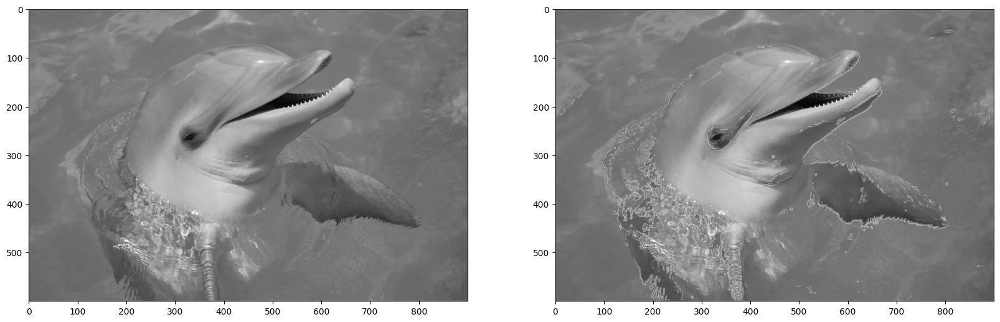

In [ ]:
img_delfin = np.uint16(cv2.imread('/content/Imagenes/delfin.jpg', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(20,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

### 3.- Implemente los filtros estadisticos min, max, moda y mediana


In [ ]:
from scipy.stats import mode

def filtro_espacial_estadistico(imagen, selem = np.ones((3,3)), filter_type='median'):
    M, N = imagen.shape
    m, n = selem.shape

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

#     img_pad = np.zeros((M+ filas_adicionales*2, N + columnas_adicionales*2))
    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * selem

            if filter_type =='min':
                resultado[i-filas_add, j-columnas_add] = np.min(multiplicacion)
            elif filter_type == 'max':
                resultado[i-filas_add, j-columnas_add] = np.max(multiplicacion)
            elif filter_type == 'median':
                resultado[i-filas_add, j-columnas_add] = np.median(multiplicacion)
            elif filter_type == 'mode':
                resultado[i-filas_add, j-columnas_add] = mode(multiplicacion, axis=None)[0]

    return resultado

1. ¿Qué es un filtro estadístico en el procesamiento de imágenes y cómo se aplica en el código mostrado?

Es una técnica utilizada para encontrar y resaltar los píxeles más nítidos o más oscuros de una imagen, o eliminar ciertos tipos de ruido de alta frecuencia.
En el código mostrado se aplica para “desaparecer” los píxeles que son ligeramente oscuros y se encuentran rodeados de píxeles claros o viceversa, con el propósito de emparejar, o aclarar y oscurecer, algunas zonas de la imagen.


2. ¿Qué diferencias existen entre los filtros de tipo min, max, median y mode? Explica en qué situaciones sería adecuado usar cada tipo.

* El filtro min selecciona el valor mínimo valor de una vecindad del píxel. Se utiliza en imágenes donde se desea reducir puntos brillantes.
* El filtro max selecciona el valor máximo de una vecindad del píxel. Se utiliza en imágenes que se desea reducir los puntos oscuros.
* El filtro median calcula la mediana de los valores de la vecindad. Se utiliza en la reducción de puntos brillantes y oscuros sin afectar mucho la nitidez de los bordes de la imagen.
* El filtro mode regresa el valor que aparece en mayor cantidad de veces en una vecindad, se recomienda el uso de este filtro en imágenes con patrones o texturas ya que reduce el ruido sin afectar los patrones repetitivos.


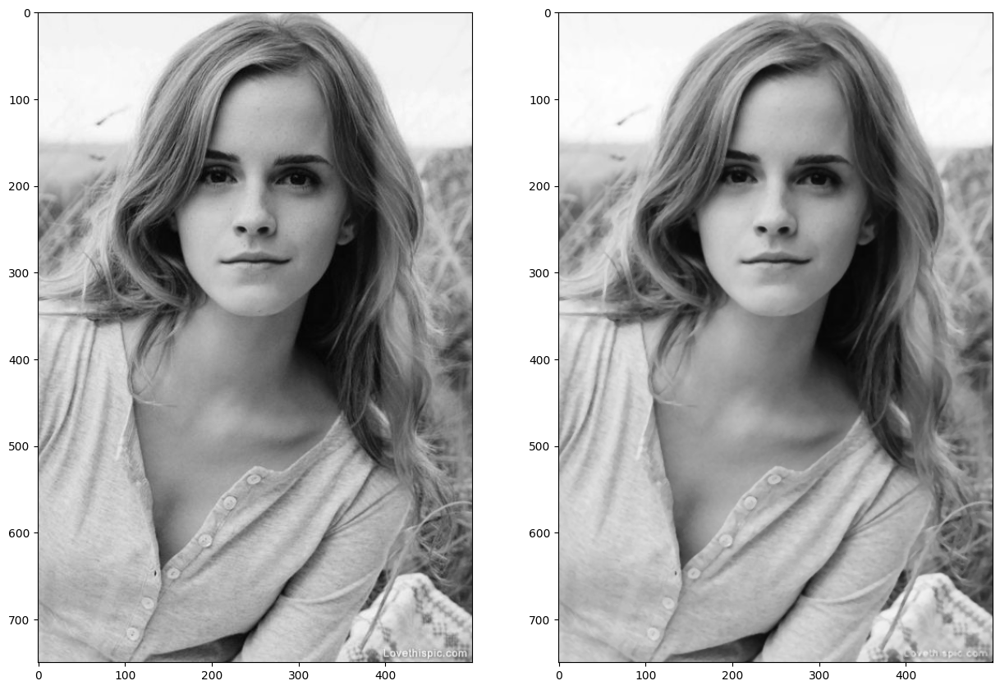

In [ ]:
#MINIMO
img_delfin = np.uint16(cv2.imread('/content/Imagenes/emma.jfif', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

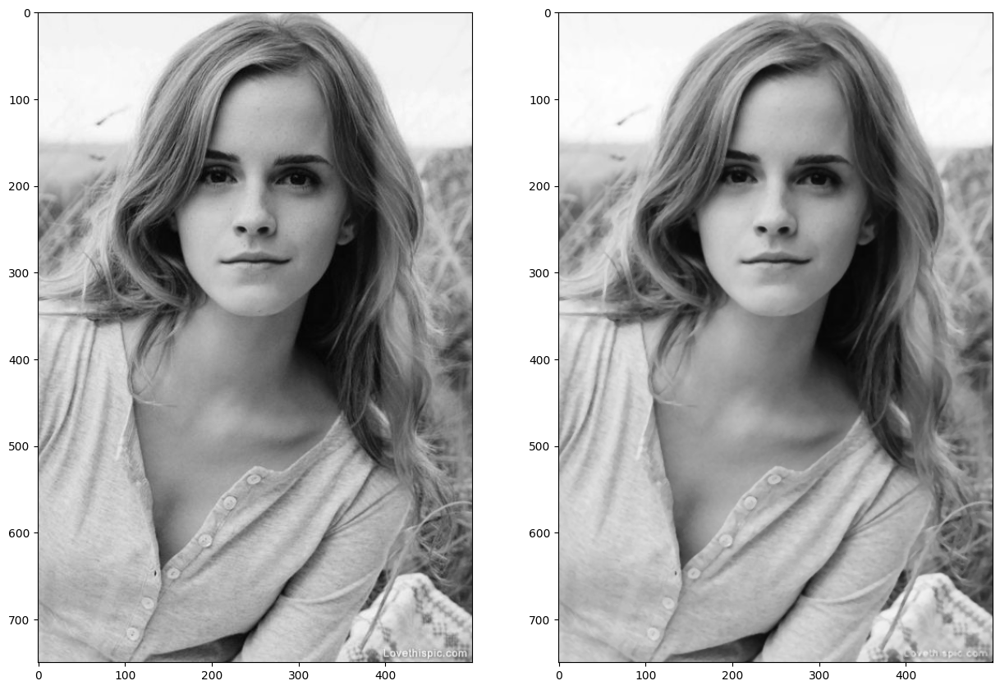

In [ ]:
#MAX
img_delfin = np.uint16(cv2.imread('/content/Imagenes/emma.jfif', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

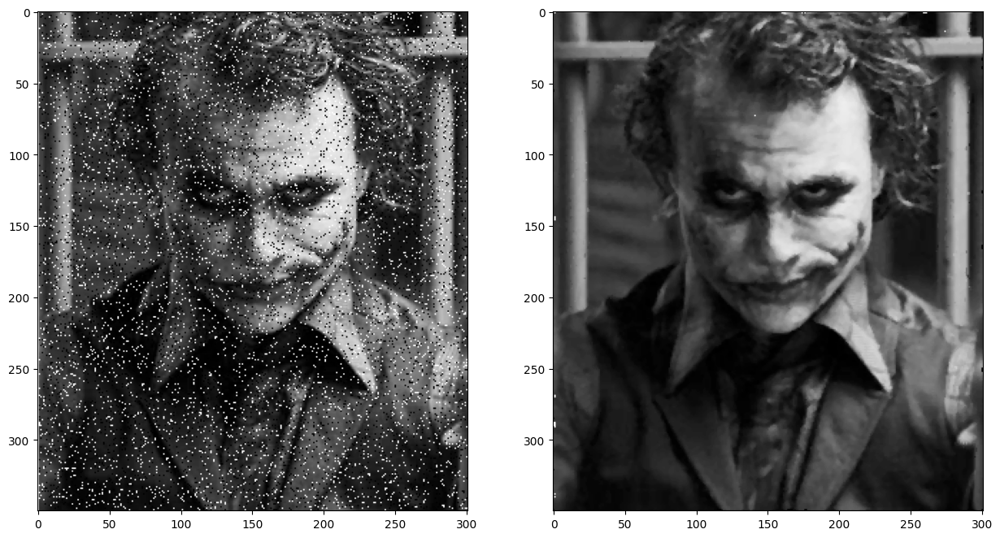

In [ ]:
#MEDIANA
img_delfin = np.uint16(cv2.imread('/content/Imagenes/ruido.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

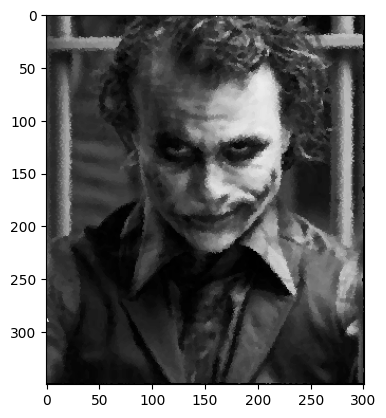

In [ ]:
img_median_mode = filtro_espacial_estadistico(img_delfin_filtrada, filter_type='mode')
plt.imshow(img_median_mode, cmap='gray')
plt.show()

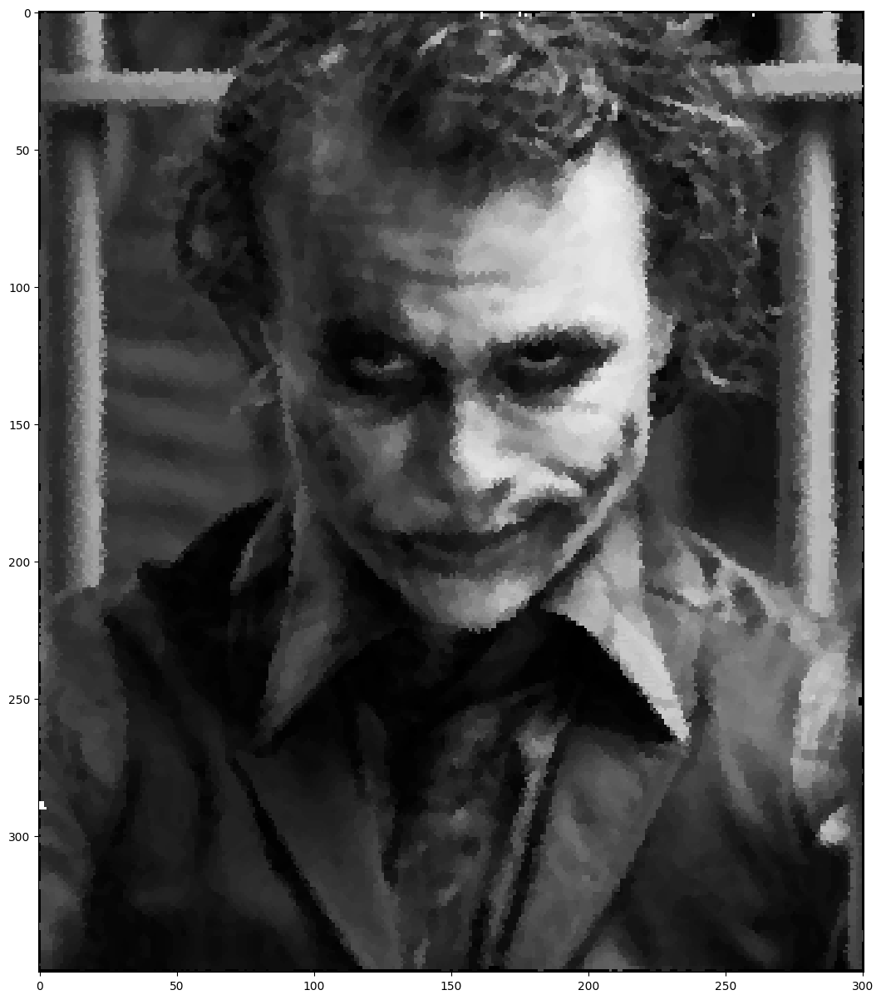

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img_median_mode, cmap='gray')
plt.show()

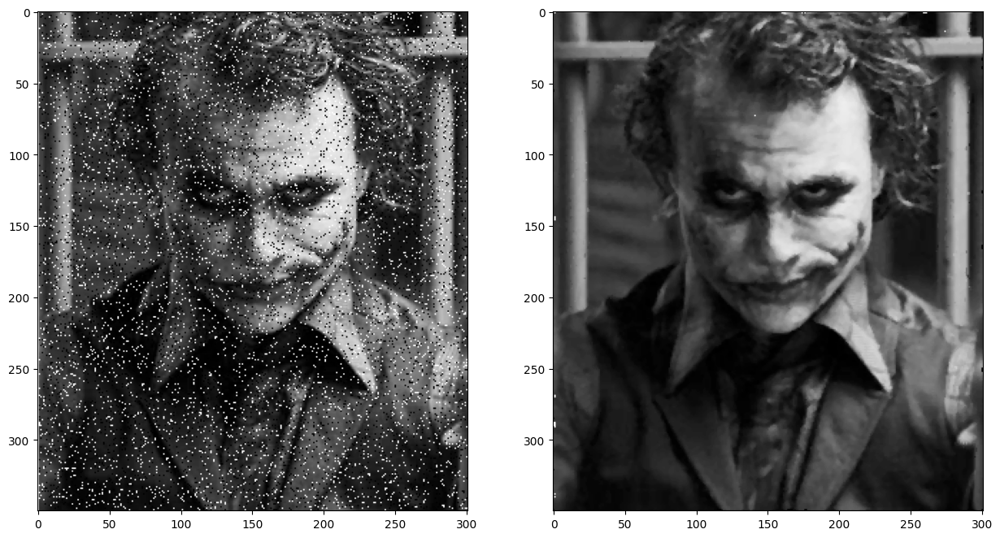

In [ ]:
#MODA
img_delfin = np.uint16(cv2.imread('/content/Imagenes/ruido.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

### 4.- Implemente los filtros espaciales de suavizado y nitidez explicados en clase

Utilizando la funcion **convolve2d(img, kernel, mode= "same")** de **scipy.signal** y los kernels:
(tambien se puede usar **correlate2d**)
* Promedio
* Gaussiano
* Laplaciano


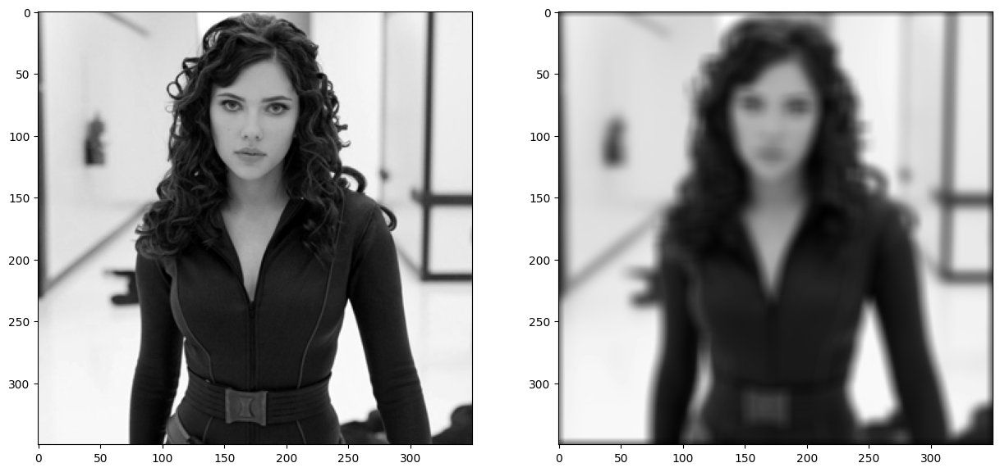

In [ ]:
#PROMEDIO
from scipy import signal

img = cv2.imread("/content/Imagenes/scarlett_oc.png", 0)/255
kernel = np.ones((11,11))/121

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(np.abs(out), cmap="gray", vmin=0, vmax=1)
plt.show()

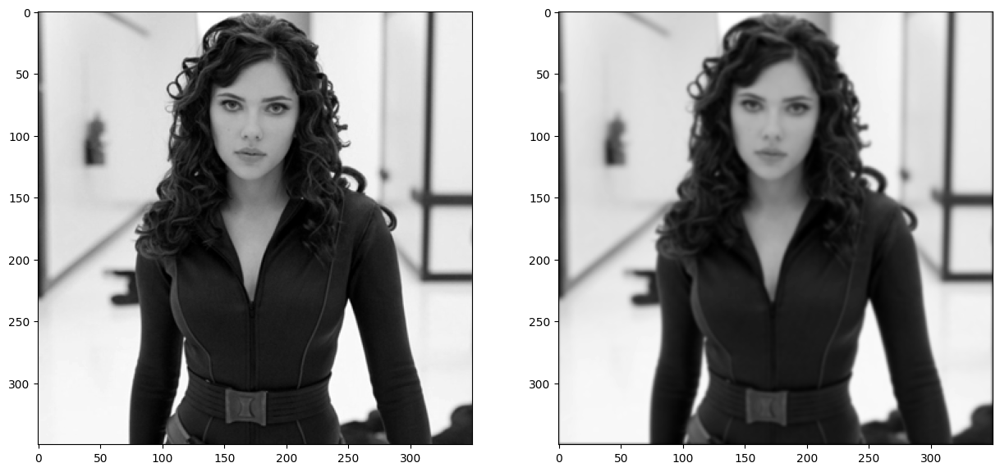

In [ ]:
#PROMEDIO
from scipy import signal

img = cv2.imread("/content/Imagenes/scarlett_oc.png", 0)/255
# kernel = np.array([[1,2,1], [2,4,2], [1,2,1]])/16
kernel = np.array([1,4,7,4,1])*np.array([[1],[4],[7],[4],[1]])
kernel = kernel/np.sum(kernel)

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(np.abs(out), cmap="gray", vmin=0, vmax=1)
plt.show()

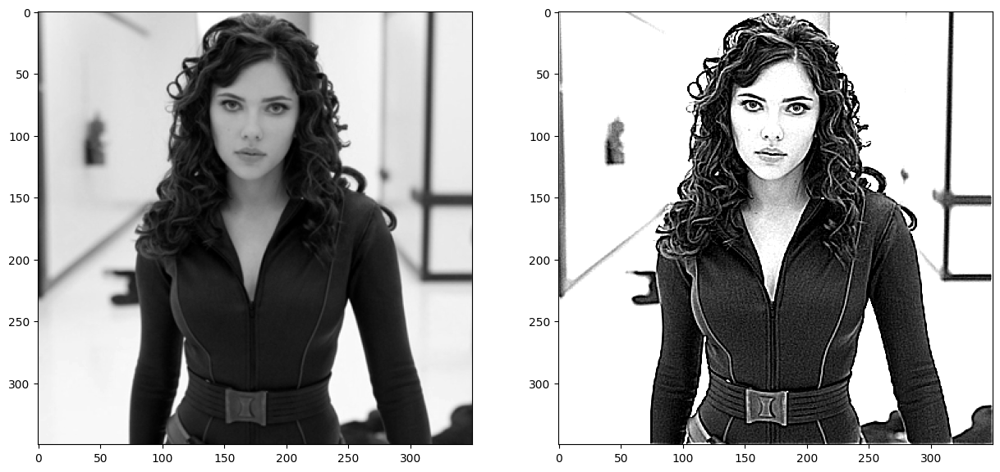

In [ ]:
#LAPLACIANO
from scipy import signal
A = 1.5
img = cv2.imread("/content/Imagenes/scarlett_oc.png", 0)/255
kernel = np.array([[-1,-1,-1], [-1,A+8,-1], [-1,-1,-1]])

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

**Utilizando OpenCV:**
* cv2.blur(img, (Tamaño_kernel))
* cv2.GaussianBlur(img,(Tamaño_kernel),desviacion_estandar)
* cv2.medianBlur(img,Tamaño_kernel)
* cv2.bilateralFilter(img,tamaño_kernel,sigmacolor,sigmaspace)  [Mas info](https://homepages.inf.ed.ac.uk/rbf/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html)

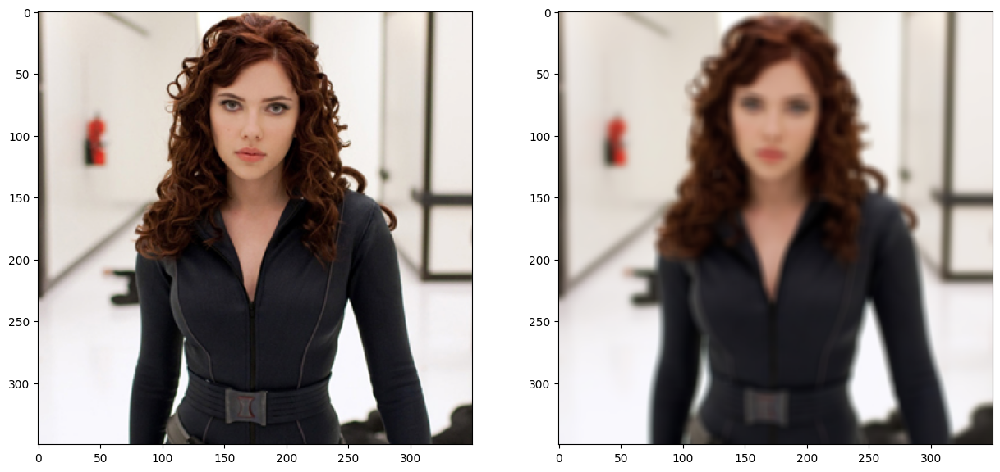

In [ ]:
img = cv2.imread("/content/Imagenes/scarlett_oc.png")[..., ::-1]

out = cv2.blur(img, (7,7))

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

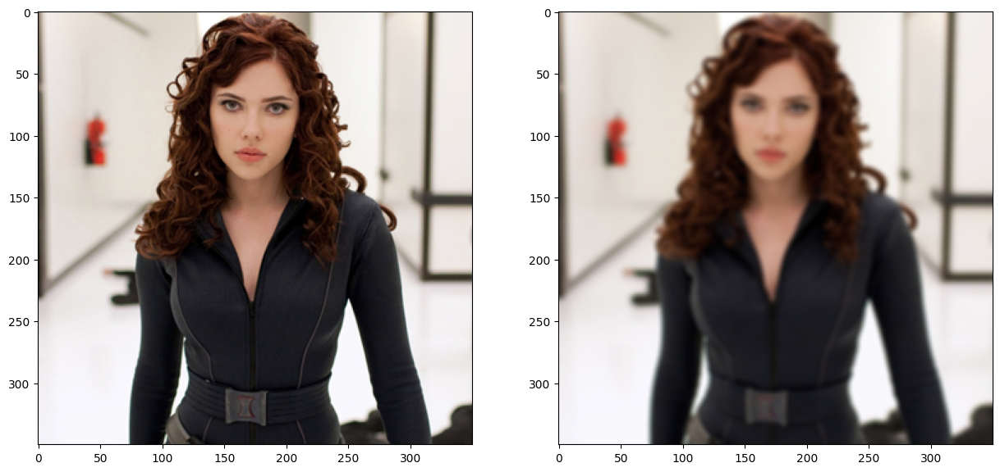

In [ ]:
out = cv2.GaussianBlur(img,(7,7), 2)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

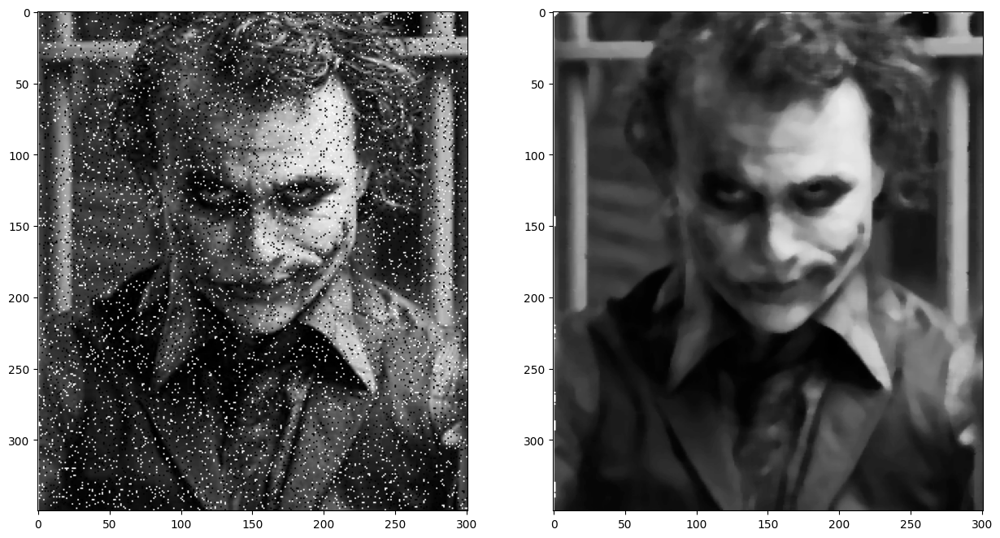

In [ ]:
img_joker = cv2.imread('/content/Imagenes/ruido.png', 0)  # Carga la imagen en escala de grises
if img_joker is None:
    print("Error: la imagen no se pudo cargar.")
else:
    img_joker_filtrada = cv2.medianBlur(img_joker, 7)  # Aplica el filtro a img_joker, no a img_delfin
    plt.subplots(1, 2, figsize=(15, 20))
    plt.subplot(121)
    plt.imshow(img_joker, cmap='gray')
    plt.subplot(122)
    plt.imshow(img_joker_filtrada, cmap='gray')
    plt.show()


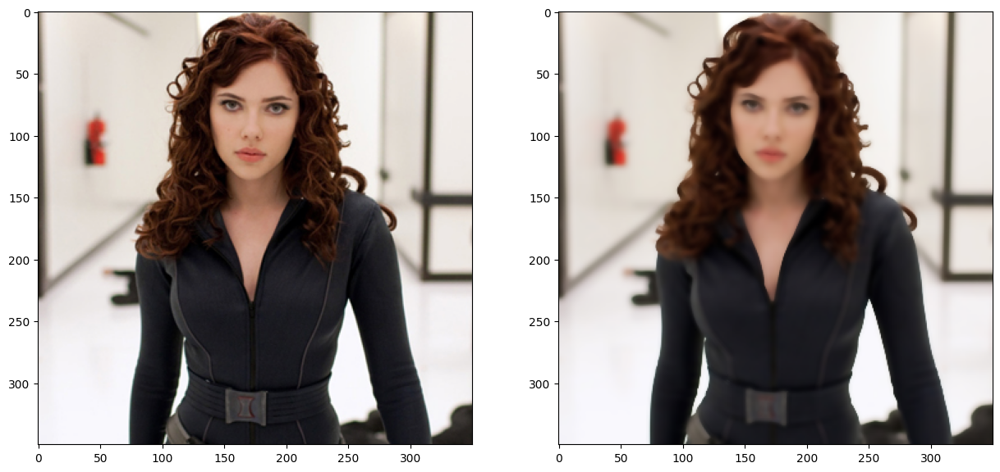

In [ ]:
out = cv2.bilateralFilter(img,7, 160, 160)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

1. ¿Cuál es la diferencia fundamental entre los filtros de suavizado (como el de promedio y el Gaussiano) y los filtros de nitidez (como el Laplaciano)?

La diferencia fundamental entre estos dos filtros es que el Gaussiano preserva bordes y disminuye el ruido de la imagen al mismo tiempo que disminuye la calidad, mientras que el filtro Laplaciano hace parecer más nítidos los bordes de una imagen de tal manera que también mejora la calidad general y los detalles de esta.

2. ¿Cuáles son las principales diferencias en los resultados obtenidos al aplicar un filtro de promedio versus un filtro Gaussiano?

* En cuanto a la distribución de promedio, el filtro de promedio asigna el mismo peso a cada píxel, resultando en una media simple de los valores de los píxeles vecinos. Mientras que el filtro Gaussiano, asigna pesos mayores a los píxeles más cercanos a la ventana y menores a los lejanos.
* El filtro promedio es menos efectivo para la reducción de ruido gaussiano en imágenes, debido a que la distribución del ruido es por igual en toda la ventana.
* Un filtro de promedio suele significar una pérdida de detalle en las áreas de transición de una imagen, mientras que el filtro Gaussiano garantiza un suavizado más natural, manteniendo los bordes.

3. ¿Qué propiedades tiene el kernel Laplaciano y cómo contribuye a la nitidez de la imagen? ¿Qué efectos visuales produce al aplicarse a una imagen?

El Kernel Laplaciano es un operador de segunda derivada que se encarga de resaltar las áreas de cambio de intensidad en una imagen. Como principal propiedad, permite detectar los bordes de la imagen sin una orientación específica, actuando simétricamente en todas las direcciones. Como efecto visual en la imagen, este filtro incrementa la nitidez al hacer que los bordes sean más prominentes, haciendo que la imagen luzca más detallada y definida.

4. ¿Qué significa el argumento mode="same" en la función convolve2d y cómo afecta el tamaño de la imagen resultante después de aplicar el filtro?

El argumento mode=”same” se encarga de controlar el tamaño de la imagen luego de aplicada la convolución. Al usar este argumento, el tamaño de salida será el mismo de la imagen de entrada.

### 5.- Implemente un algoritmo para muestre el uso de la mascara de desenfoque (unsharp mask) y el filtro de altoaumento (Highboost)

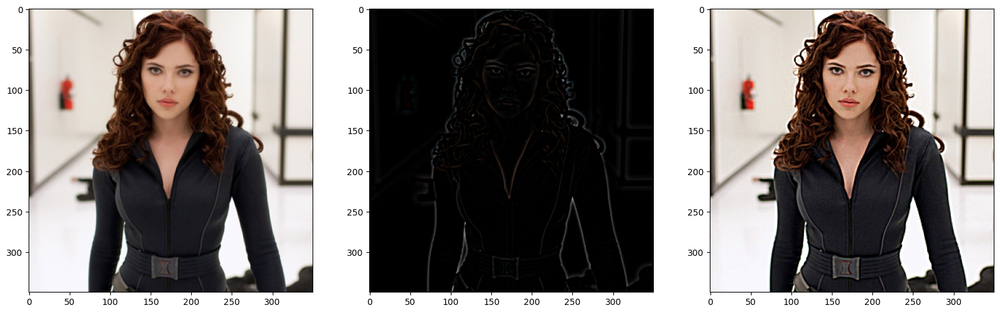

In [ ]:
img = cv2.imread("/content/Imagenes/scarlett_oc.png")[..., ::-1]/255

blur = cv2.blur(img, (7,7))

mask = img - blur

unsharp_image = mask + img

plt.figure(figsize=(20,15))
plt.subplot(131)
plt.imshow(img, cmap="gray")
plt.subplot(132)
plt.imshow(mask, cmap="gray")
plt.subplot(133)
plt.imshow(unsharp_image, cmap='gray', vmin=0, vmax=1)
plt.show()

1. ¿Cómo funciona la máscara de desenfoque (unsharp mask) para realzar los detalles de una imagen, y cuál es el papel del filtro de suavizado en este proceso?

La máscara de desenfoque funciona realizando una serie de procesos, iniciando por un suavizado de la imagen original, luego resta de la imagen suavizada a la original, para solo obtener los detalles o bordes de la imagen, y finalmente se suma estos bordes a la imágen original.
El paso de suavizado juega un papel fundamental ya que permite eliminar el ruido y detalles finos de la imagen, preparando la imagen para la resta del siguiente paso.

2.  ¿En qué se diferencia el filtro de alto aumento (Highboost) de la máscara de desenfoque estándar, y cómo se puede ajustar el factor de amplificación (boosting factor) para controlar el nivel de realce en la imagen?

El filtro de alto aumento es capaz de eliminar el desenfoque y permite controlar el grado de realce de detalles de borde, intensificando los detalles destacados.  Mientras que la máscara de desenfoque solo resta la versión suavizada de la imagen original para lograr resaltar los bordes. El nivel de realce puede ajustarse a través del factor de amplificación (A), este factor se incorpora en el proceso de filtrado sumando la imagen original a una fracción amplificada de la imagen de detalles.

### 6.- Implemente un algoritmo para mostrar la gradiente de una imagen
**Use las mascaras:**
* Roberts
* Prewit
* Sobel
* Scharr

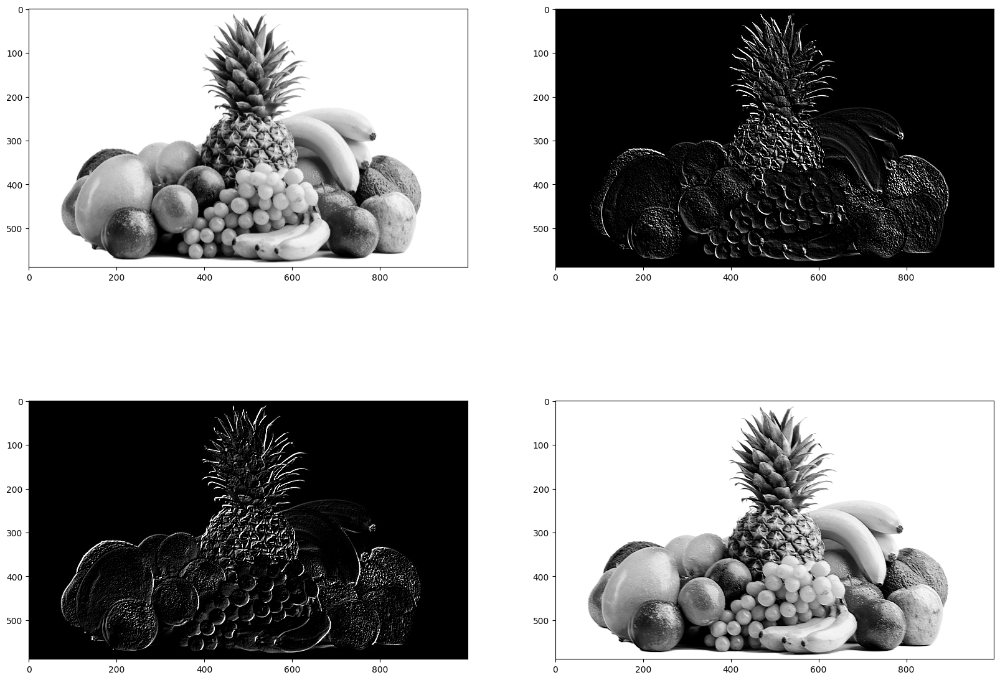

In [ ]:
#ROBERTS
img = cv2.imread("/content/Imagenes/frutas.jpg", 0)/255

kernelh = np.array([[0,-1],[1,0]])
kernelv = np.array([[-1,0],[0,1]])

outh = signal.convolve2d(img, kernelh, mode= "same")
outv = signal.convolve2d(img, kernelv, mode= "same")

outf = outh + outv

plt.figure(figsize=(20,15))
plt.subplot(221)
plt.imshow(img, cmap="gray")
plt.subplot(222)
plt.imshow(outh * 5, cmap="gray", vmin=0, vmax=1)
plt.subplot(223)
plt.imshow(outv * 5, cmap="gray", vmin=0, vmax=1)
plt.subplot(224)
plt.imshow(outf + img, cmap="gray", vmin=0, vmax=1)
plt.show()

1. ¿Cuál es la característica distintiva de la máscara de Roberts al calcular el gradiente de una imagen, y por qué podría ser menos precisa que otras máscaras?

La máscara de Roberts (utiliza una matriz de 2x2) calcula la gradiente evaluando el cambio de intensidad en las diagonales. De este modo, puede significar una desventaja a comparación de otras máscaras, puesto que  puede resultar menos precisa para detectar bordes en imágenes con ruido o para capturar detalles sutiles.

2. ¿Cómo afectan las máscaras de Sobel y Scharr a la precisión y sensibilidad en la detección de bordes en una imagen? ¿En qué casos se prefiere una sobre la otra?

La máscara de Sobel permite resaltar bordes en una dirección horizontal o vertical pero posee limitaciones en los cambios sutiles de bordes, por otro lado la máscara de Scharr posee las mismas características con la diferencia de que está modificada para mejorar estas limitaciones. Se prefiere la máscara de Sobel para aplicaciones de procesamiento de bordes fuertes y definidos y que se necesite poco gasto computacional, como el procesamiento en tiempo real. Se prefiere la máscara de Scharr cuando se desea mayor precisión y detalles en los bordes de imágenes que poseen bordes poco definidos o complejos, teniendo en cuenta que el gasto computacional será más elevado.